### necessary imports

In [1]:
import pandas as pd
import stumpy as sp
import matplotlib.pyplot as plt
import numpy as np
import os
from matplotlib.patches import Rectangle

## set window size for later use in functions

In [2]:
# windows=[('window=5', 5),('window=6', 6),('window=7', 7),] 
windows=[('window=3', 3),('window=4', 4),('window=5', 5),]   

### Function to calculate profile using stumpy.stump method

In [10]:
def cal_profile(data,windows =windows):
    ''' data should be values of a column '''

    data=data.astype('float64')
    profiles = {}

    for label, window_size in windows:
        mp=sp.stump(data, window_size,ignore_trivial = True)
        key = '{} Profile'.format(label)
        profiles[key] = mp
    return profiles

In [4]:

def sort_index(profiles,windows =windows):
    
    sorted_index=[]
    
    for label,value in windows:
        key='{} Profile'.format(label)
        sort=np.argsort(profiles[key][:,0])
        sorted_index.append(sort)
  
    return sorted_index

In [5]:
def find_motif_discord(profiles,windows =windows):
    sorted_index=sort_index(profiles,windows)
    motifs={}
    neighbors={}
    discords={}
    discord_distance={}
    i=0
    for label,window in windows:
        
        key='{} Profile'.format(label)

        motif=sorted_index[i][0]
        motifs[label]=motif
        neighbors[label]=profiles[key][motif,1]

        x=len(sorted_index[i])
        discord=sorted_index[i][x:x-6:-1]
        discord

        discords[label]=discord
#         discord_distance[label]=profiles[key][discord,0]
        
        i+=1
        
    return motifs,neighbors, discords, discord_distance

## Visualize profiles

In [17]:
def visualize(user_name,data,data_index,figname,windows = windows,ylabel='Data'):
    profiles=cal_profile(data=data,windows=windows)
    motifs,neighbors,discords,distance=find_motif_discord(profiles)
     
    fig, axes = plt.subplots(len(windows)*2,1,figsize=(15,20))
    ax_idx=0
    axes[ax_idx].set_title(user_name)
    
    for label, window in windows:
        
        key = '{} Profile'.format(label)
        profile = profiles[key]
        axes[ax_idx].plot(data)
        axes[ax_idx].set_title(user_name+ ' '+label,fontsize=20)
        axes[ax_idx].set_xlim(0,len(data_index))

        ax_idx+=1
        #display discord
        axes[ax_idx].plot(profile[:,0])
        
        for v in discords[label]:
            
            
            x=(data[v:v+window])
            t=np.arange(v,v+window)
            axes[ax_idx-1].plot(t,x,color='red')

            axes[ax_idx].axvline(x=v, linestyle="dashed",color='red', marker='o')
            axes[ax_idx].set_title('Discords')
            axes[ax_idx].set_ylabel('Matrix Profile')
        
        ax_idx+=1



    plt.xlabel('Date')
    plt.tight_layout()
    plt.savefig(user_name+figname +'.jpg')
    return fig


In [18]:
user=pd.read_csv('GHH0288.csv',index_col=0)
user.index=pd.to_datetime(user.index)
user.index
user=user[(user.index.month<=6)& (user.index.year==2010)]
user

,Negative,Neutral,Positive
str_date,,,
2010-01-04,0.0,0.0,1.0
2010-01-05,0.0,0.0,1.0
2010-01-06,0.0,0.0,1.0
2010-01-07,0.0,0.0,1.0
2010-01-08,0.0,0.0,1.0
...,...,...,...
2010-06-24,0.0,0.0,1.0
2010-06-25,0.0,0.0,1.0
2010-06-28,1.0,0.0,0.0


<AxesSubplot:xlabel='str_date'>

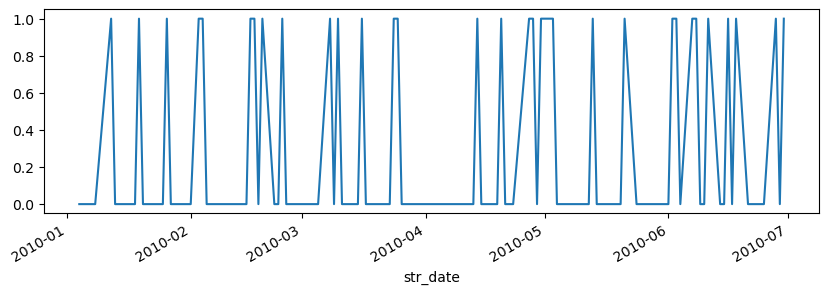

In [19]:

plt.figure(figsize=(10,3))
plt.locator_params('both',len(user['Negative']))
user['Negative'].plot()

A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.


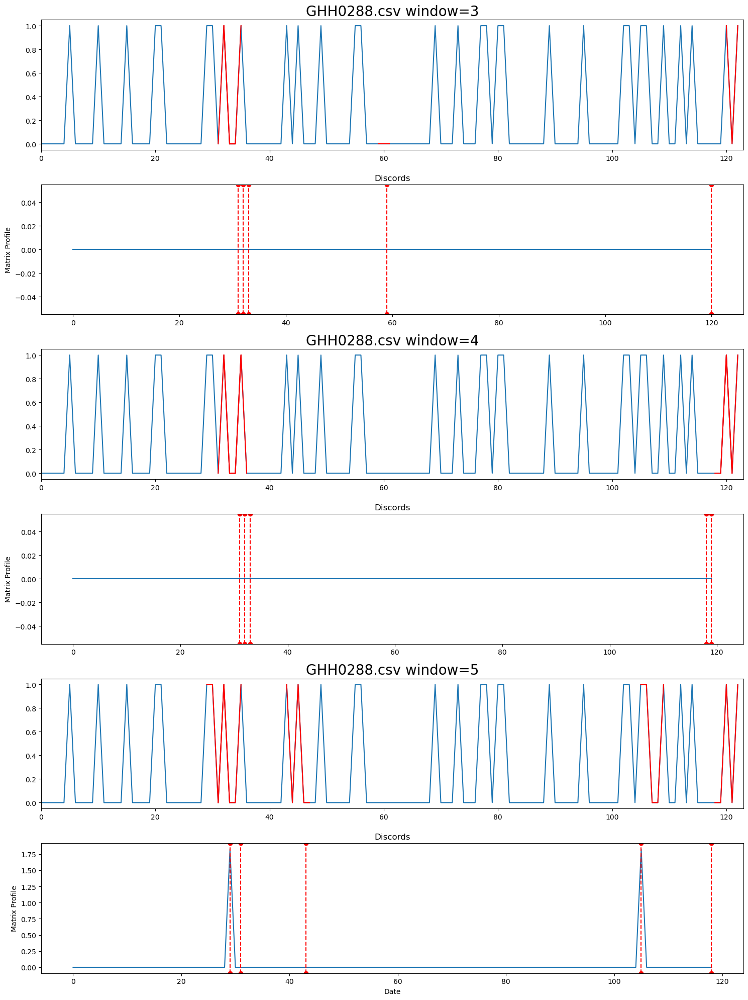

In [20]:
# cols=user.columns
# figures=['negative_profile','neutral_profile','positive_profile']
# for i in range(len(user.columns)):
#     profile=cal_profile(user[cols[i]].values)
#     visualize(profile,user[cols[i]].values,figname=figures[i])
    
profile=cal_profile(user['Negative'].values)
x=visualize('GHH0288.csv',user['Negative'].values,data_index=user.index.date,figname='negative profile')


## Automate 

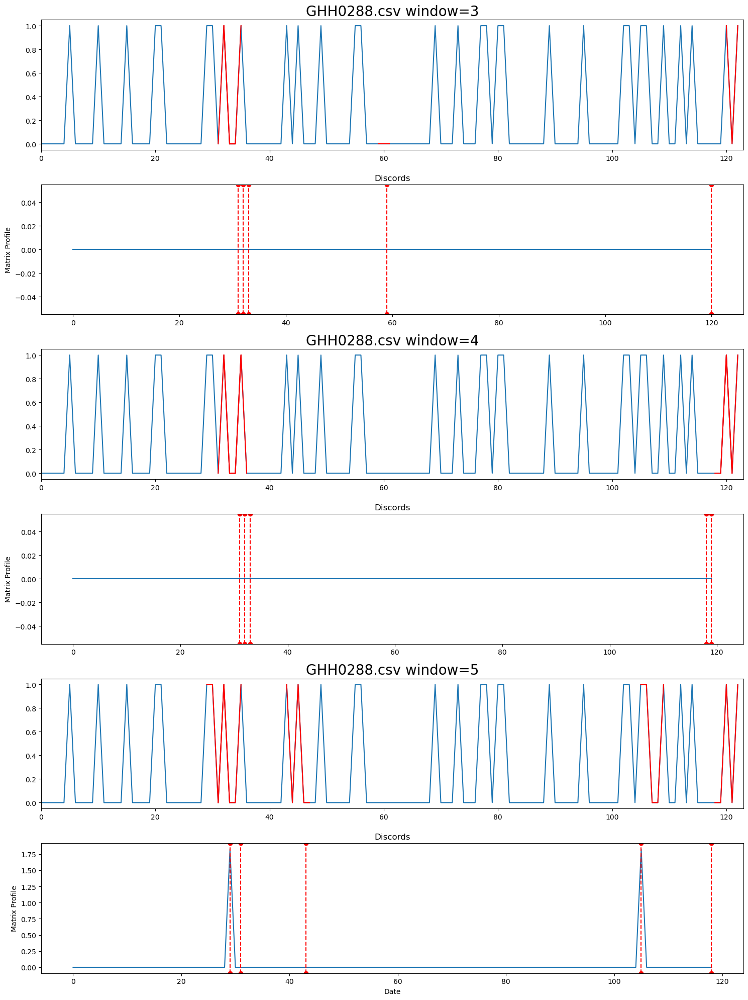

In [12]:
x

In [13]:
os.listdir(os.getcwd())

['.ipynb_checkpoints',
 'AAE0190.csv',
 'AAE0190.csvnegative profile.jpg',
 'AAE0190.csvNegative.jpg',
 'AAE0190.csvNeutral.jpg',
 'AAE0190.csvPositive.jpg',
 'AAF0535.csv',
 'AAF0535.csvnegative profile.jpg',
 'AAF0535.csvNegative.jpg',
 'AAF0535.csvNeutral.jpg',
 'AAF0535.csvPositive.jpg',
 'AAF0791.csv',
 'AAF0791.csvNegative.jpg',
 'AAF0791.csvNeutral.jpg',
 'AAF0791.csvPositive.jpg',
 'AAL0706.csv',
 'AAL0706.csvNegative.jpg',
 'AAL0706.csvNeutral.jpg',
 'AAL0706.csvPositive.jpg',
 'Auto_email_mp.ipynb',
 'GHH0288.csv',
 'GHH0288.csvnegative profile.jpg',
 'GHH0288.csvNegative.jpg',
 'GHH0288.csvNeutral.jpg',
 'GHH0288.csvPositive.jpg',
 'GHL0460.csv',
 'GHL0460.csvNegative.jpg',
 'GHL0460.csvNeutral.jpg',
 'GHL0460.csvPositive.jpg']

In [14]:
csvfiles=[]
for file in os.listdir(os.getcwd()) :
    if file.endswith('csv'):
        csvfiles.append(file)
        
csvfiles

['AAE0190.csv',
 'AAF0535.csv',
 'AAF0791.csv',
 'AAL0706.csv',
 'GHH0288.csv',
 'GHL0460.csv']

            Negative  Neutral  Positive
str_date                               
01-03-2011       9.0      2.0       3.0
01-04-2010       6.0      4.0       4.0
01-04-2011       1.0      8.0       5.0
01-05-2010       6.0      4.0       3.0
01-05-2011       6.0      0.0       8.0
01-06-2010       6.0      0.0       8.0
01-06-2011       3.0      0.0      11.0
01-07-2010       2.0      4.0       8.0
01-07-2011       7.0      2.0       5.0
01-08-2010       2.0      5.0       6.0
            Negative  Neutral  Positive
str_date                               
01-04-2010       2.0      0.0       1.0
01-05-2010       2.0      0.0       1.0
01-06-2010       1.0      0.0       1.0
01-07-2010       0.0      0.0       3.0
01-08-2010       0.0      0.0       3.0
01-11-2010       1.0      1.0       1.0
01-12-2010       0.0      1.0       2.0
01-13-2010       0.0      0.0       3.0
01-14-2010       2.0      0.0       1.0
01-15-2010       1.0      0.0       2.0
            Negative  Neutral  Positive


A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.


            Negative  Neutral  Positive  Logoff  Logon  Connect  Disconnect
str_date                                                                   
01-03-2011       0.0      0.0       1.0       1      1        0           0
01-04-2010       1.0      0.0       0.0       1      1        0           0
01-04-2011       1.0      0.0       0.0       1      1        0           0
01-05-2010       0.0      0.0       1.0       1      1        0           0
01-05-2011       1.0      0.0       0.0       1      1        0           0
01-06-2010       0.0      0.0       1.0       1      1        0           0
01-06-2011       0.0      0.0       1.0       1      1        0           0
01-07-2010       0.0      0.0       1.0       1      1        0           0
01-07-2011       1.0      0.0       0.0       1      1        0           0
01-08-2010       0.0      0.0       1.0       1      1        0           0


A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try set

            Negative  Neutral  Positive
str_date                               
01-03-2011       0.0      0.0       1.0
01-04-2010       0.0      0.0       1.0
01-04-2011       1.0      0.0       0.0
01-05-2010       0.0      0.0       1.0
01-05-2011       0.0      0.0       1.0
01-06-2010       0.0      0.0       1.0
01-06-2011       1.0      0.0       0.0
01-07-2010       0.0      0.0       1.0
01-07-2011       1.0      0.0       0.0
01-08-2010       0.0      0.0       1.0


A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.


            Negative  Neutral  Positive
str_date                               
01-04-2010       0.0      0.0       1.0
01-05-2010       1.0      0.0       0.0
01-06-2010       0.0      0.0       1.0
01-07-2010       0.0      0.0       1.0
01-08-2010       1.0      0.0       0.0
01-11-2010       1.0      0.0       0.0
01-12-2010       0.0      0.0       1.0
01-13-2010       0.0      0.0       1.0
01-14-2010       0.0      1.0       0.0
01-15-2010       1.0      0.0       0.0


C:\Users\TLS\AppData\Local\Temp\ipykernel_10984\781053190.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(len(windows)*2,1,figsize=(15,20))
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivial = True`.
A large number of values are smaller than 1e-05.
For a self-join, try setting `ignore_trivi

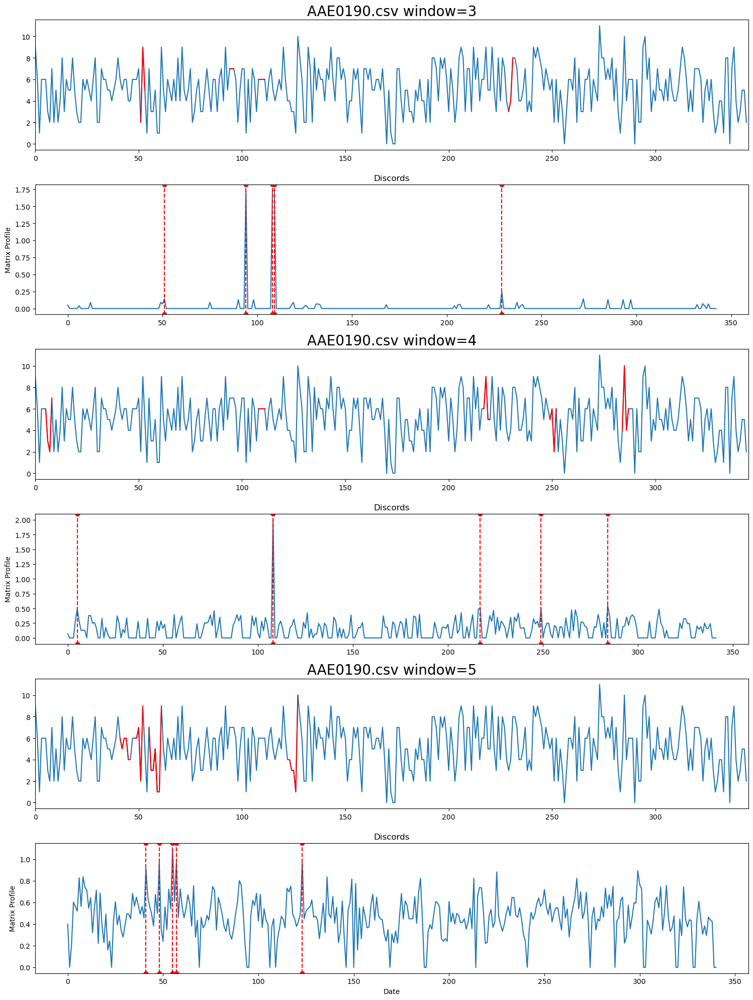

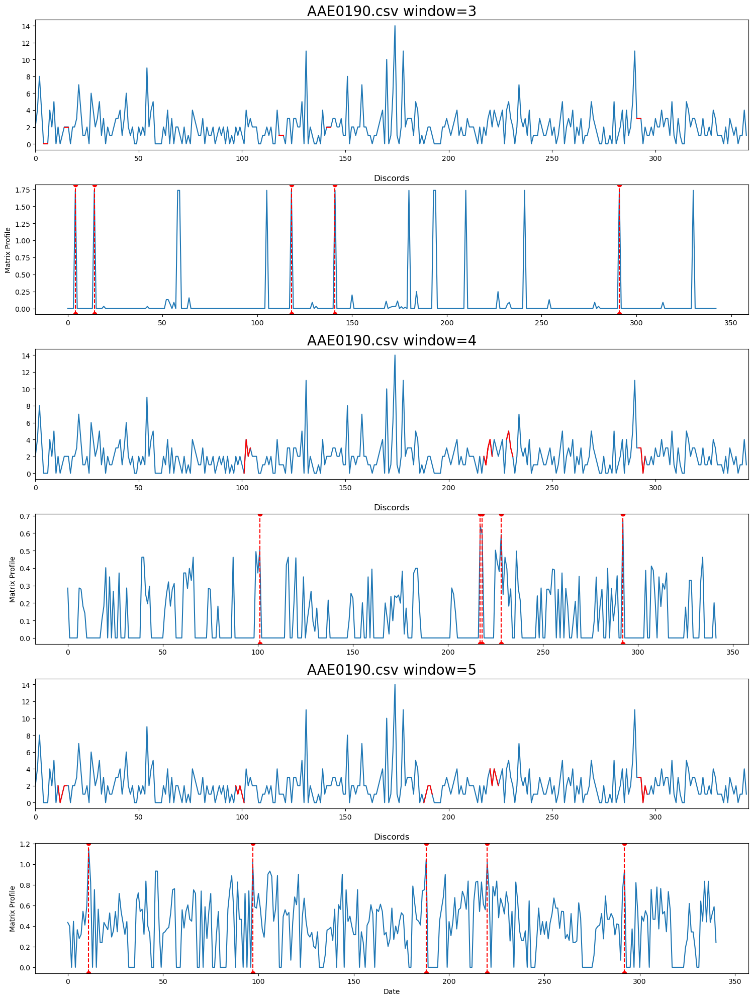

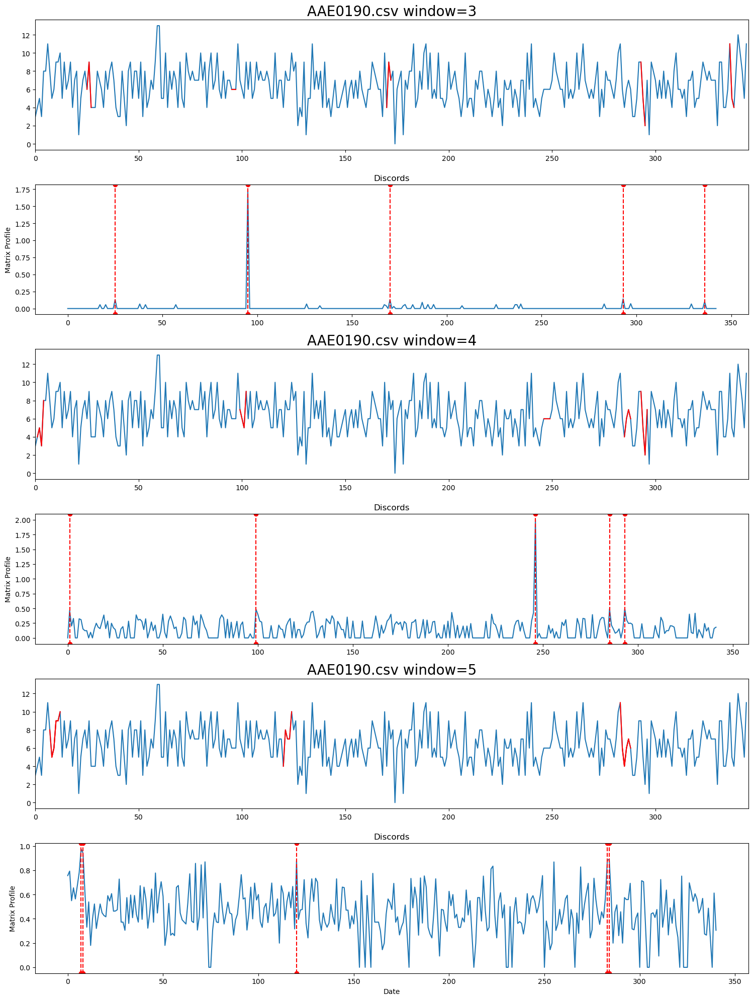

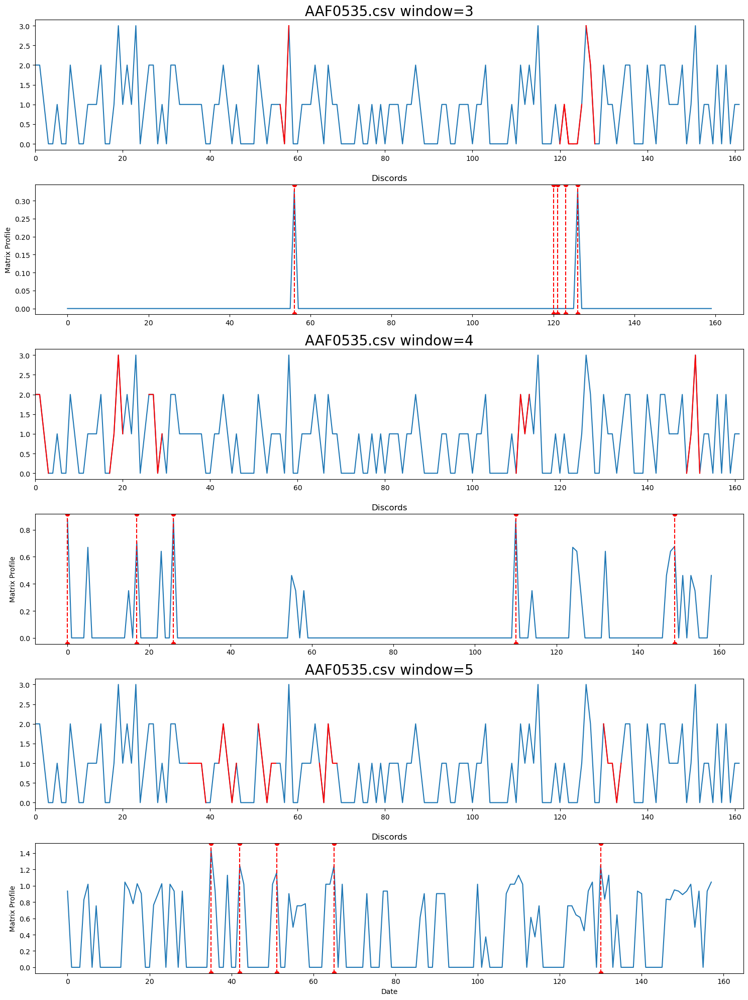

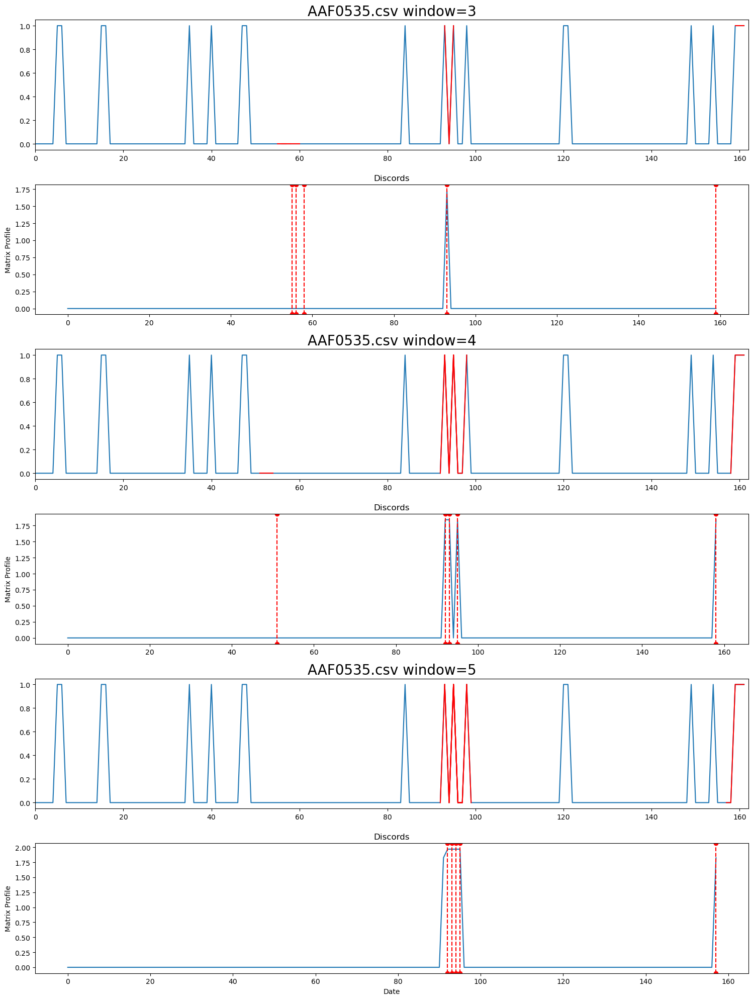

...

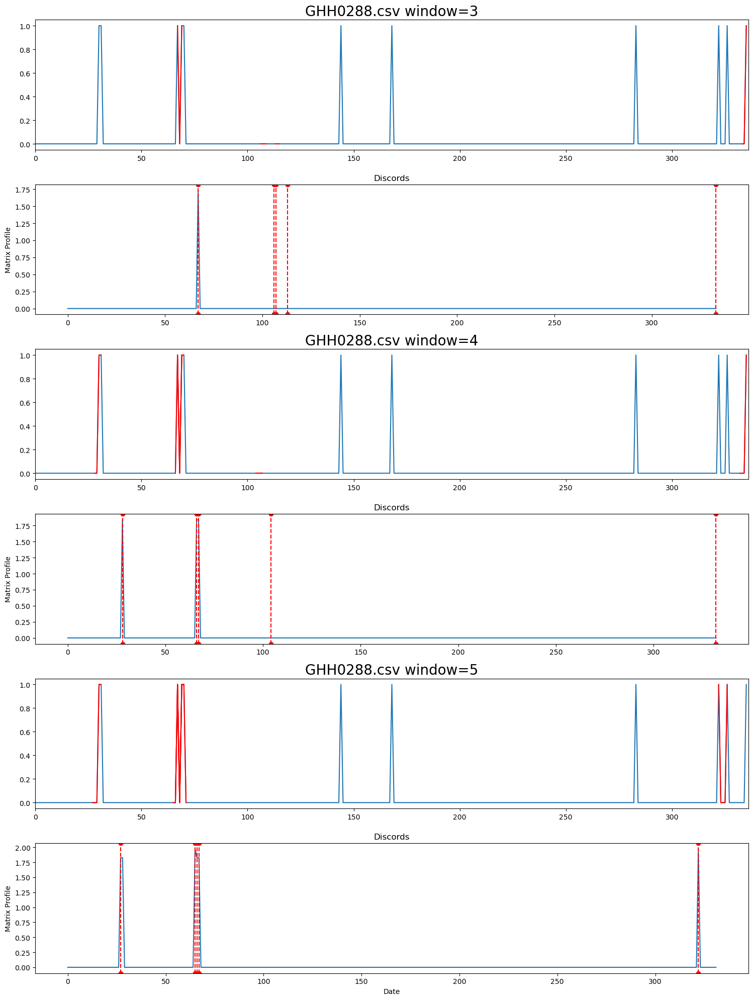

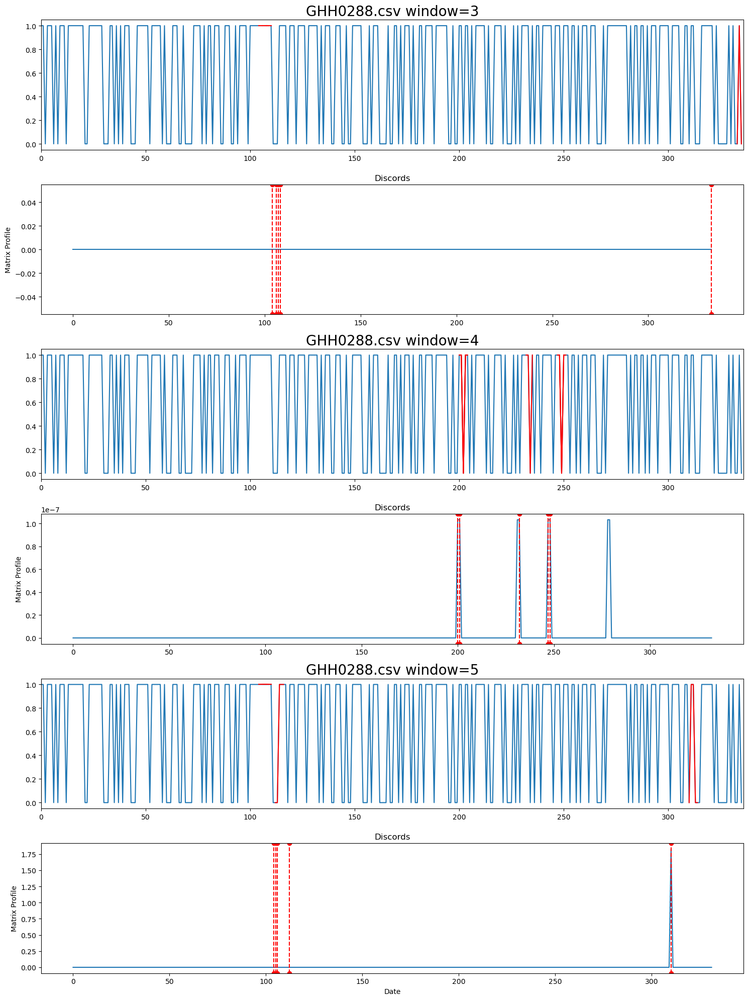

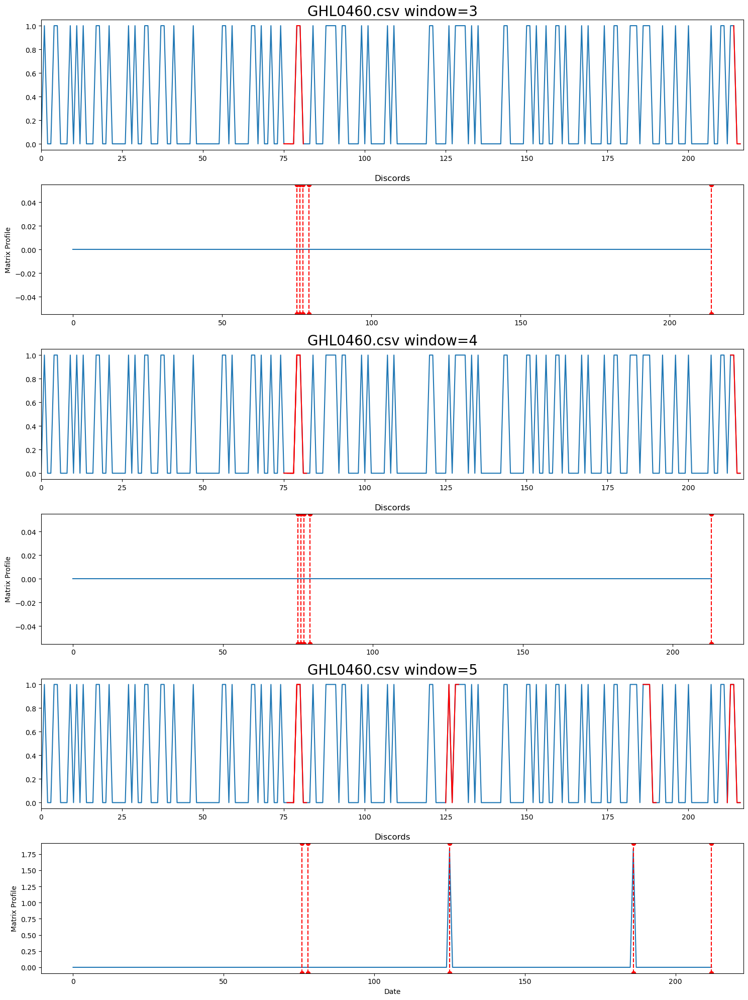

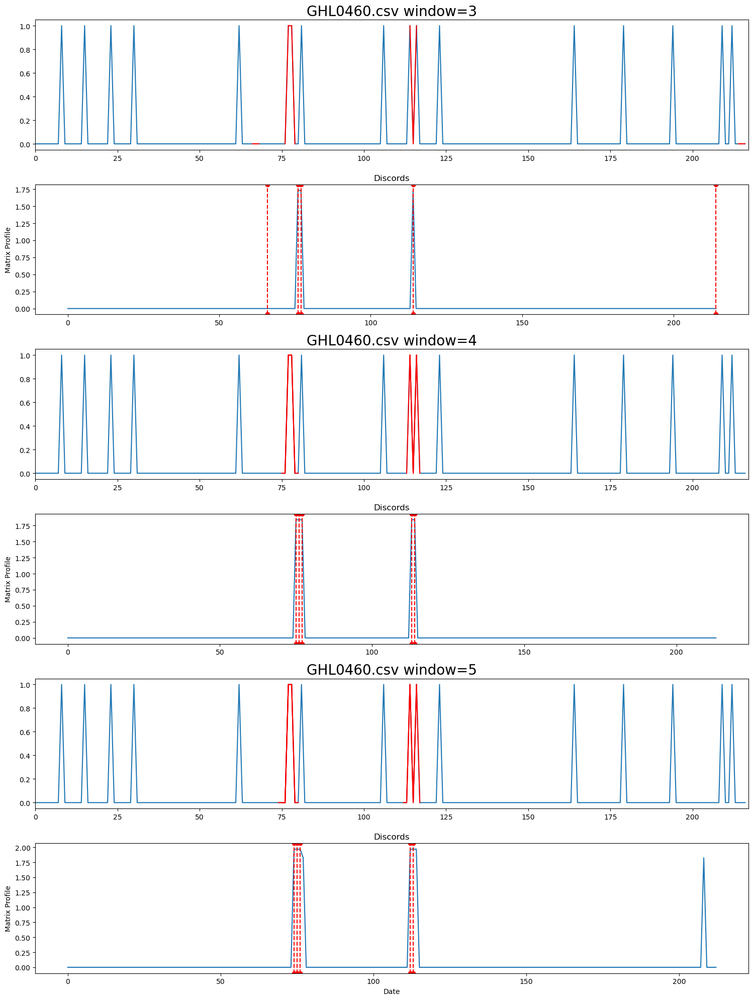

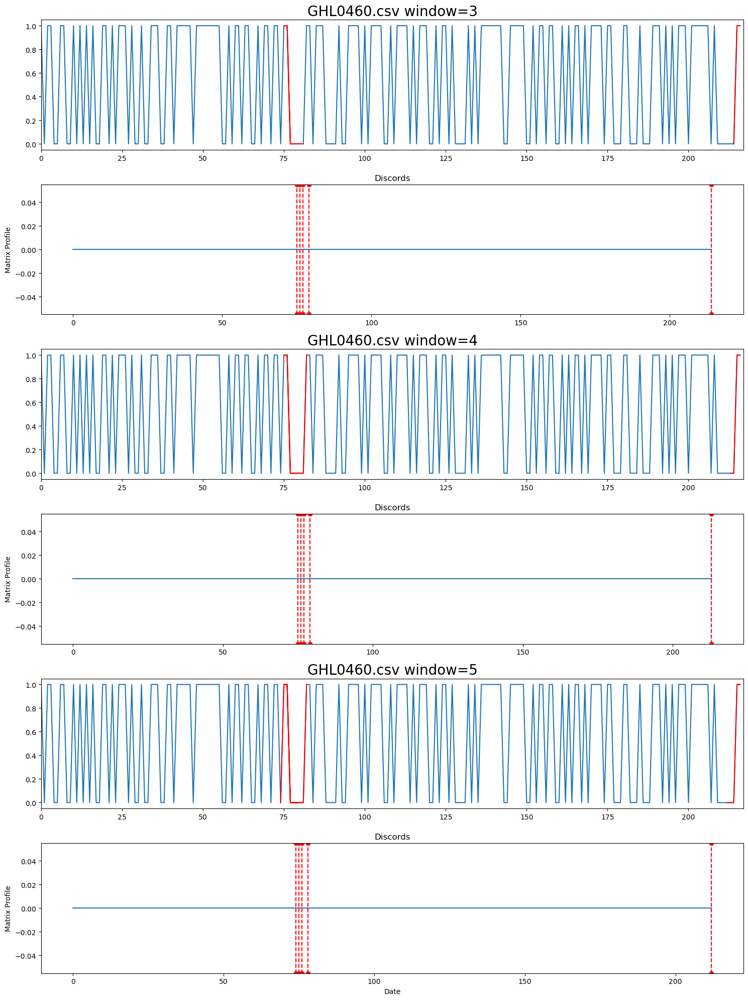

In [21]:
for user_file in csvfiles:
#     print(user_file)
    user=pd.read_csv(user_file,index_col=0)
    print(user.head(10))
    cols=user.columns
#     figures=['negative_profile','neutral_profile','positive_profile']
    for i in range(len(user.columns)):
        profile=cal_profile(user[cols[i]].values)
        visualize(user_file,user[cols[i]].values,user.index,figname=cols[i])

    
#     print(user.head())

In [16]:
data=pd.read_csv('AAE0190.csv')
data.head()

,str_date,Negative,Neutral,Positive
0,01-03-2011,9.0,2.0,3.0
1,01-04-2010,6.0,4.0,4.0
2,01-04-2011,1.0,8.0,5.0
3,01-05-2010,6.0,4.0,3.0
4,01-05-2011,6.0,0.0,8.0
